## Downloading the data

In [1]:
import gdown
import zipfile
import os

gdown.download(id='1y73mUPzS5Hhq1RjPXc9bxch-Nv6HlJem')

with zipfile.ZipFile('ign_dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('ign_dataset')

os.remove('ign_dataset.zip')

## Data Preparation

In [2]:
!pip install patchify

In [3]:
from patchify import patchify
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import random

import keras as ks
import keras.backend as K
import tensorflow as tf

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
# Constants

ENV = 'local'

if ENV == 'colab':
    from google.colab import drive
    drive.mount('/content/drive')
    BASE_DIR = '/content/drive/MyDrive/Colab Notebooks/ign/'
    DEST_BASE_DIR = '/content/drive/MyDrive/Colab Notebooks/ign_patched/'
elif ENV == 'kaggle':
    BASE_DIR = '../input/ign-satellite/ign/'
    DEST_BASE_DIR = '../working/ign_patched/'
elif ENV == 'local':
    BASE_DIR = './ign/'
    DEST_BASE_DIR = './ign_patched/'
else:
    raise Exception()


PATCH_SIZE = 248

SEED = 24
BATCH_SIZE = 32
N_CLASSES = 7

### Patching images

I choose to work with smaller patches (248x248) instead of the whole images (1000x1000), mainly because this enabled me to use a way bigger batch size (32 instead of 2) with the following benefits:
* faster training due to being able to process the same amount of information parallely
* more stable (and hence fast) learning thanks to the use of batch normalization layers
* a bigger dataset to work with (even tho the amount of information is the same)
I choose 248 for the patch side because it's divisible by 8 (while 250 is not) which makes things nicer in the U-Net downsampling phase

All of this without loss of generality on the segmentation task

In [10]:
folder_pairs = [['images', 'images'], ['annotations', 'masks']]

if not os.path.exists(DEST_BASE_DIR):
    os.mkdir(DEST_BASE_DIR)
    os.mkdir(os.path.join(DEST_BASE_DIR, 'train'))
    os.mkdir(os.path.join(DEST_BASE_DIR, 'train', 'images'))
    os.mkdir(os.path.join(DEST_BASE_DIR, 'train', 'masks'))
    os.mkdir(os.path.join(DEST_BASE_DIR, 'val'))
    os.mkdir(os.path.join(DEST_BASE_DIR, 'val', 'images'))
    os.mkdir(os.path.join(DEST_BASE_DIR, 'val', 'masks'))
else:
    print(f"Folder {DEST_BASE_DIR} existed already")


if len(os.listdir(os.path.join(DEST_BASE_DIR, 'train', 'images'))) == 0:
    for k in range(len(folder_pairs)):
        for path, subdirs, files in os.walk(BASE_DIR+folder_pairs[k][0]):
            dirname = path.split(os.path.sep)[-1]
            print(dirname)
            images = os.listdir(path)

            for index, image_name in enumerate(images):
                if image_name.endswith('.png'):
                    image = cv2.imread(os.path.join(path, image_name))
                    SIZE_X = (image.shape[1]//PATCH_SIZE)*PATCH_SIZE
                    SIZE_Y = (image.shape[0]//PATCH_SIZE)*PATCH_SIZE
                    image = Image.fromarray(image)
                    image = image.crop((0 ,0, SIZE_X, SIZE_Y))  #Crop from top left corner
                    image = np.array(image)

                    patches_img = patchify(image, (PATCH_SIZE, PATCH_SIZE, 3), step=PATCH_SIZE)
                    # print(patches_img.shape)

                    for i in range(patches_img.shape[0]):
                        for j in range(patches_img.shape[1]):

                            single_patch_img = np.squeeze(patches_img[i,j,...])

                            if dirname == 'validation':
                                destination_folder = 'val'
                            elif dirname == 'training':
                                destination_folder = 'train'
                            else:
                                raise Exception()
                            cv2.imwrite(
                                f"{os.path.join(DEST_BASE_DIR, destination_folder, folder_pairs[k][1], image_name[:-4])}_patch_{i}_{j}.tif",
                                single_patch_img)

                if index % 100 == 99:
                    print(f"Processing image number: {index + 1}")
else:
    print('Patching already done')

images
validation
Processing image number: 100
Processing image number: 200
training
Processing image number: 100
Processing image number: 200
Processing image number: 300
Processing image number: 400
Processing image number: 500
Processing image number: 600
annotations
validation
Processing image number: 100
Processing image number: 200
training
Processing image number: 100
Processing image number: 200
Processing image number: 300
Processing image number: 400
Processing image number: 500
Processing image number: 600


In [11]:
print(len(os.listdir(os.path.join(DEST_BASE_DIR, 'train', 'images'))))
print(len(os.listdir(os.path.join(DEST_BASE_DIR, 'train', 'masks'))))
print(len(os.listdir(os.path.join(DEST_BASE_DIR, 'val', 'images'))))
print(len(os.listdir(os.path.join(DEST_BASE_DIR, 'val', 'masks'))))

9600
9600
3200
3200


### Data visualization

In [12]:
palette = [
    [255, 0, 0],
    [0, 255, 0],
    [0, 0, 255],
    [255, 255, 0],
    [255, 0, 255],
    [0, 255, 255],
    [255, 255, 255]
]

def display(x, y_true, y_pred=None):

    ys_img = []
    for y in [y_true, y_pred]:
        if y is not None:
            classes_index = np.argmax(y, axis=-1)
            color_image = K.gather(palette, classes_index)
            ys_img.append(color_image)

    fig = plt.figure(figsize=(10, 10))

    r, c = 1, len(ys_img) + 1

    fig.add_subplot(r, c, 1)
    plt.imshow(x)
    plt.title("Input")

    for i in range(len(ys_img)):
        fig.add_subplot(r, c, i + 2)
        plt.imshow(ys_img[i])
        plt.title("Ground truth" if i == 0 else 'Prediction')

    plt.show()
    plt.close()


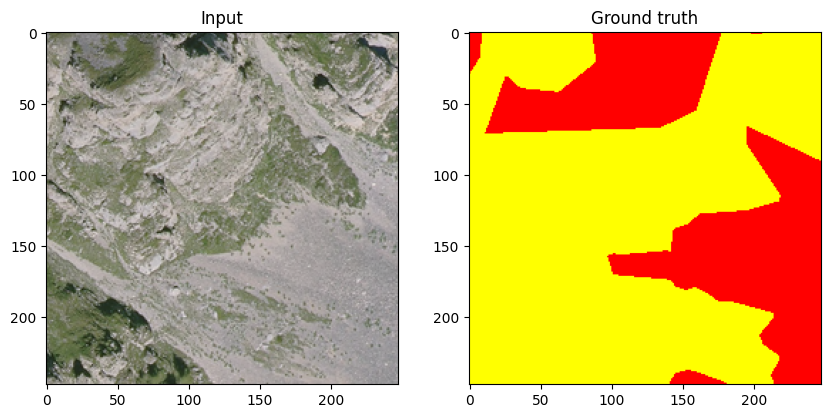

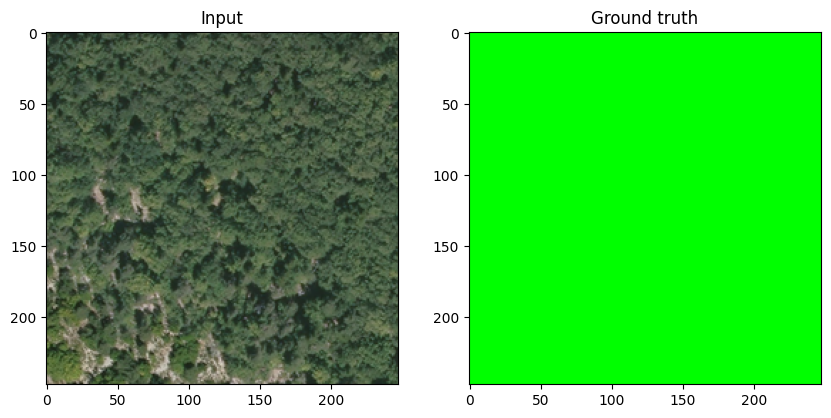

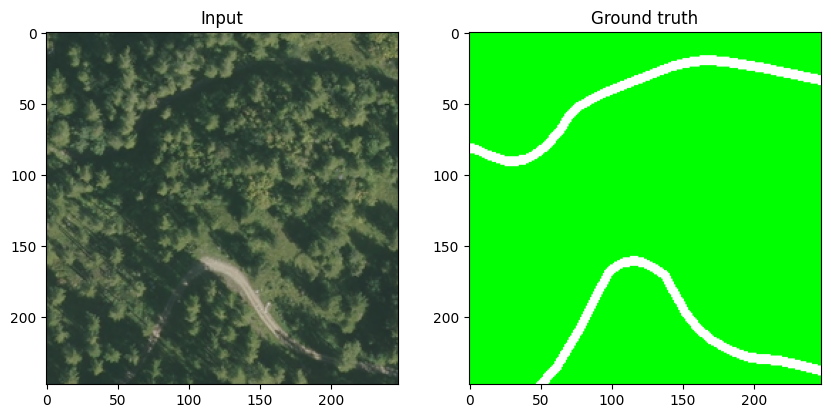

In [13]:
# Visualize some data

train_names = sorted(os.listdir(os.path.join(DEST_BASE_DIR, 'train', 'images')))
test_names = sorted(os.listdir(os.path.join(DEST_BASE_DIR, 'val', 'images')))

for i in range(3):
    j = random.randint(0, len(train_names) - 1)
    x_sample = plt.imread(os.path.join(DEST_BASE_DIR, 'train', 'images', train_names[j]))
    y_sample = ks.utils.img_to_array(ks.utils.load_img(os.path.join(DEST_BASE_DIR, 'train', 'masks', train_names[j]), color_mode='grayscale'))

    display(x_sample, ks.utils.to_categorical(y_sample, num_classes=7))


## Data Generator

In [14]:
class MyDataGenerator(ks.utils.Sequence):

    def __init__(self, folder_path, names, set_type, batch_size, shuffle=True):

        self.x_folder_path = os.path.join(folder_path, set_type, 'images')
        self.y_folder_path = os.path.join(folder_path, set_type, 'masks')

        self.names = names

        self.batch_size = batch_size
        self.shuffle = shuffle

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.names)

    def __getitem__(self, index):
        batch_names = self.names[index * self.batch_size : (index+1) * self.batch_size]

        x_batch = np.asarray([self.__get_input(os.path.join(self.x_folder_path, img_name)
                                                ) for img_name in batch_names])

        y_batch = np.asarray([self.__get_output(os.path.join(self.y_folder_path, img_name)
                                                ) for img_name in batch_names])

        return x_batch, y_batch

    def __len__(self):
        return len(self.names) // self.batch_size

    def __get_input(self, path):
        image = ks.utils.load_img(path)
        image_arr = ks.utils.img_to_array(image)

        return image_arr

    def __get_output(self, path):
        image = ks.utils.load_img(path, color_mode='grayscale')
        image_arr = ks.utils.img_to_array(image)
        return ks.utils.to_categorical(image_arr, num_classes=N_CLASSES)

In [15]:
traingen = MyDataGenerator(folder_path=DEST_BASE_DIR,
                           names=train_names,
                           set_type='train',
                           batch_size = BATCH_SIZE)

valgen = MyDataGenerator(folder_path=DEST_BASE_DIR,
                         names=test_names,
                         set_type='val',
                         batch_size = BATCH_SIZE)

In [16]:
x_trial, y_trial = traingen[9]

In [17]:
print(f"An input batch shape is: {x_trial.shape}")
print(f"An output batch shape is: {y_trial.shape}")

An input batch shape is: (32, 248, 248, 3)
An output batch shape is: (32, 248, 248, 7)


## Loss functions and metrics

I experimented with the three following loss functions:
* Dice Loss (multilabel) = 1 - Dice_coefficient_multilabel
* Categorical cross entropy
* A combination of the two above

In the end I settled for Dice Loss

In [18]:
# Metrics

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    smooth = 0.0001
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_multilabel(y_true, y_pred, numLabels=7):
    dice=0
    for index in range(numLabels):
        dice += dice_coef(y_true[...,index], y_pred[...,index])
    return dice/numLabels

# Losses

def dice_multilabel_loss(y_true, y_pred, numLabels=7):
    return 1. - dice_coef_multilabel(y_true, y_pred)

def cce_dice_loss(y_true, y_pred):
    return ks.losses.CategoricalCrossentropy()(y_true, y_pred) + dice_multilabel_loss(y_true, y_pred)


## The model

For the model, after some experimentation with U-Net and its variants, I choose DRUNET, which stands for Dilated-Residual U-Net, implemented from the paper "DRUNET: A Dilated-Residual U-Net Deep Learning Network to Digitally Stain Optic Nerve Head Tissues in Optical Coherence Tomography Images"

It enabled me to get good results with a really low number of parameters compared to the standard U-Net, around 48K parameters.

In [19]:
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input, BatchNormalization, Rescaling, RandomFlip
from keras.layers import concatenate, add
from keras.models import Model
from keras.optimizers import RMSprop

In [20]:
def encoder(x, filters, n_block, kernel_size=(3, 3), drate=2, activation='relu', batchnorm=False):
    skip = []
    for i in range(n_block):
        x1 = Conv2D(filters, kernel_size, dilation_rate=drate ** i, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x)
        x1 = BatchNormalization()(x1) if batchnorm else x1
        x2 = Conv2D(filters, kernel_size, dilation_rate=drate ** i, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x1)
        x2 = BatchNormalization()(x2) if batchnorm else x2

        res = Conv2D(filters, (1, 1), dilation_rate=drate ** i, 
                     activation=activation, padding='same', kernel_initializer="he_normal")(x)
        res = BatchNormalization()(res) if batchnorm else res

        x = add([x2, res])
        x = BatchNormalization()(x) if batchnorm else x
        skip.append(x)
        x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
    return x, skip

In [21]:
def bottleneck(x, filters_bottleneck, drate, depth=1, kernel_size=(3, 3), activation='relu', batchnorm=False):
    for _ in range(depth):
        x1 = Conv2D(filters_bottleneck, kernel_size, dilation_rate=drate, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x)
        x1 = BatchNormalization()(x1) if batchnorm else x1
        x2 = Conv2D(filters_bottleneck, kernel_size, dilation_rate=drate, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x1)
        x2 = BatchNormalization()(x2) if batchnorm else x2

        res = Conv2D(filters_bottleneck, (1, 1), dilation_rate=drate, 
                     activation=activation, padding='same', kernel_initializer="he_normal")(x)
        x = add([x2, res])
        x = BatchNormalization()(x) if batchnorm else x
    return x

In [22]:
def decoder(x, skip, filters, n_block, kernel_size=(3, 3), drate=2, activation='relu', batchnorm=False):
    for i in reversed(range(n_block)):
        x = UpSampling2D(size=(2, 2))(x)
        x = Conv2D(filters, kernel_size, activation=activation, 
                   padding='same', kernel_initializer="he_normal")(x)
        x = BatchNormalization()(x) if batchnorm else x
        x = concatenate([skip[i], x])


        x1 = Conv2D(filters, kernel_size, dilation_rate=drate ** i, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x)
        x1 = BatchNormalization()(x1) if batchnorm else x1
        x2 = Conv2D(filters, kernel_size, dilation_rate=drate ** i, 
                    activation=activation, padding='same', kernel_initializer="he_normal")(x1)
        x2 = BatchNormalization()(x2) if batchnorm else x2
        res = Conv2D(filters, (1, 1), dilation_rate=drate ** i, 
                     activation=activation, padding='same', kernel_initializer="he_normal")(x)
        res = BatchNormalization()(res) if batchnorm else res

        x = add([x2, res])
        x = BatchNormalization()(x) if batchnorm else x

    return x

In [23]:
def build_drunet(
    input_shape=(248, 248, 3),
    filters=16,
    dilation_rate=2,
    batchnorm=False,
    n_block=3,
    depth=1,
    loss=dice_multilabel_loss,
    learning_rate=0.001,
):
    input = Input(input_shape)

    input = Rescaling(scale=1./255.)(input)
    input = RandomFlip(mode="horizontal_and_vertical", seed=SEED)(input)  # optional Data Augmentation

    enc, skip = encoder(input, filters, n_block, drate=dilation_rate, batchnorm=batchnorm)
    bottle = bottleneck(enc, filters, dilation_rate**n_block, depth=depth, batchnorm=batchnorm)
    dec = decoder(bottle, skip, filters, n_block, drate=dilation_rate, batchnorm=batchnorm)

    classify = Conv2D(N_CLASSES, (1, 1), activation='softmax')(dec)

    model = Model(inputs=input, outputs=classify)
    model.compile(optimizer=RMSprop(learning_rate), loss=loss, metrics=[dice_coef_multilabel])

    return model

In [25]:
model = build_drunet(input_shape=(248, 248, 3), filters=16, dilation_rate=2,
                   batchnorm=True, loss=dice_multilabel_loss)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 248, 248, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 248, 248, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 248, 248, 16  64         ['conv2d[1][0]']                 
 alization)                     )                                                             

### Plot the model architecture

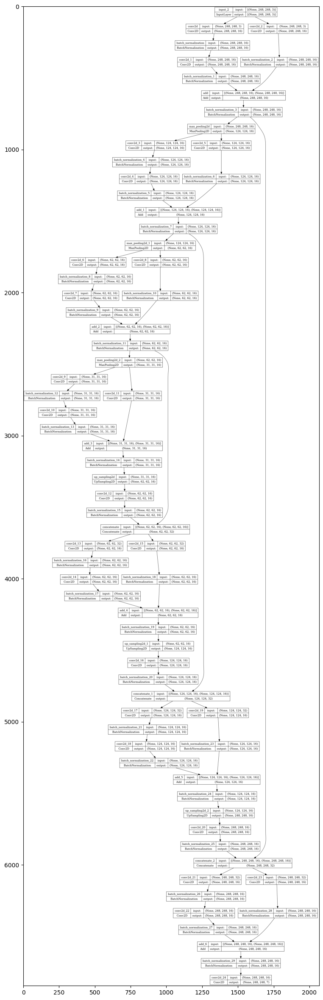

In [29]:
from matplotlib import image as mpimg
from matplotlib.pyplot import figure   

MODEL_FILE = os.path.join(DEST_BASE_DIR, 'model.png')
tf.keras.utils.plot_model(model, to_file=MODEL_FILE, show_shapes=True)

figure(figsize=(36, 30))
img = mpimg.imread(MODEL_FILE)
plt.imshow(img)
plt.show()

### Callbacks

I created a custom callback to display some validation images, together with their prediction, after every few training epochs

In [30]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from datetime import datetime

class DisplayCallback(ks.callbacks.Callback):
    def __init__(self, epoch_interval=None, num_images=None):
        self.epoch_interval = epoch_interval
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and (epoch+1) % self.epoch_interval == 0:

            for _ in range(self.num_images):
                index = random.randint(0, len(test_names)-1)
                name = test_names[index]

                x_path = os.path.join(DEST_BASE_DIR, 'val', 'images', name)
                x = ks.utils.img_to_array(ks.utils.load_img(x_path))
                x_img = np.array(Image.open(x_path))

                y_path = os.path.join(DEST_BASE_DIR, 'val', 'masks', name)
                y = ks.utils.img_to_array(ks.utils.load_img(y_path, color_mode='grayscale'))
                y_true = ks.utils.to_categorical(y, num_classes=N_CLASSES)

                y_pred = np.squeeze(self.model.predict(np.expand_dims(x, axis=0)))

                display(x_img, y_true, y_pred)
#                 print(f"Dice coefficient multilabel of prediction: {dice_coef_multilabel(y_true, y_pred)}")

CHECKPOINT_PATH = '../working/cp.ckpt'
callbacks = [DisplayCallback(10, 10),
             EarlyStopping(monitor='val_dice_coef_multilabel',
                            patience=15,
                            verbose=1,
                            min_delta=1e-4,
                            mode='max'),
            ReduceLROnPlateau(monitor='val_loss',
                            patience=8,
                            verbose=1,
                            mode='min'),
            ModelCheckpoint(monitor='val_dice_coef_multilabel',
                            filepath=CHECKPOINT_PATH,
                            save_best_only=True,
                            save_weights_only=True,
                            verbose=1,
                            mode='max')]

### Training

Epoch 1/100
300/300 [==============================] - ETA: 0s - loss: 0.6566 - dice_coef_multilabel: 0.3434
Epoch 1: val_dice_coef_multilabel improved from -inf to 0.36123, saving model to ../working/cp.ckpt
300/300 [==============================] - 126s 389ms/step - loss: 0.6566 - dice_coef_multilabel: 0.3434 - val_loss: 0.6388 - val_dice_coef_multilabel: 0.3612 - lr: 0.0010
Epoch 2/100
300/300 [==============================] - ETA: 0s - loss: 0.5761 - dice_coef_multilabel: 0.4239
Epoch 2: val_dice_coef_multilabel did not improve from 0.36123
300/300 [==============================] - 115s 382ms/step - loss: 0.5761 - dice_coef_multilabel: 0.4239 - val_loss: 0.6634 - val_dice_coef_multilabel: 0.3366 - lr: 0.0010
Epoch 3/100
300/300 [==============================] - ETA: 0s - loss: 0.5296 - dice_coef_multilabel: 0.4704
Epoch 3: val_dice_coef_multilabel improved from 0.36123 to 0.40566, saving model to ../working/cp.ckpt
300/300 [==============================] - 111s 371ms/step - lo

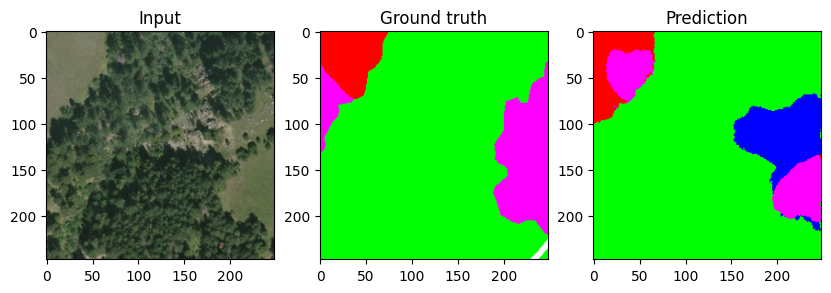

Dice coefficient multilabel of prediction: 0.2717452645301819
1/1 [==============================] - 0s 23ms/step


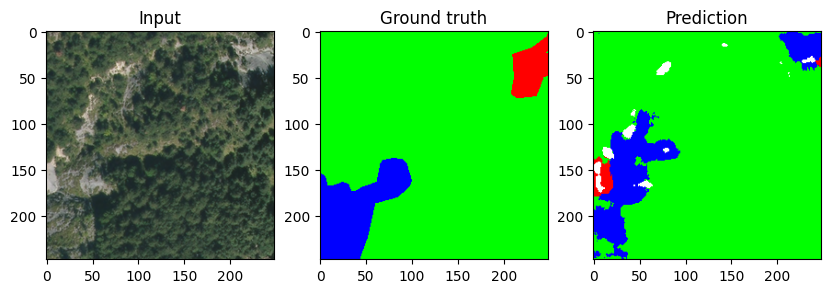

Dice coefficient multilabel of prediction: 0.1876412332057953
1/1 [==============================] - 0s 24ms/step


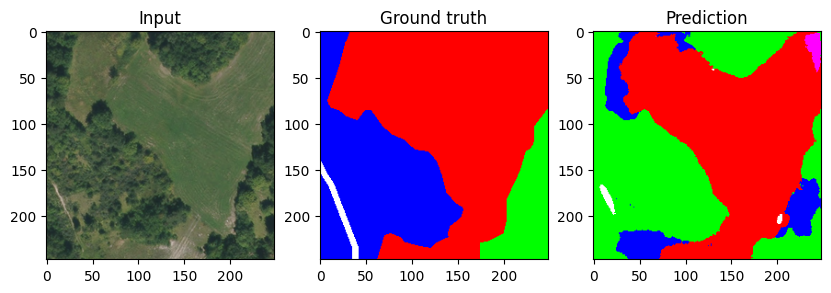

Dice coefficient multilabel of prediction: 0.21296833455562592
1/1 [==============================] - 0s 24ms/step


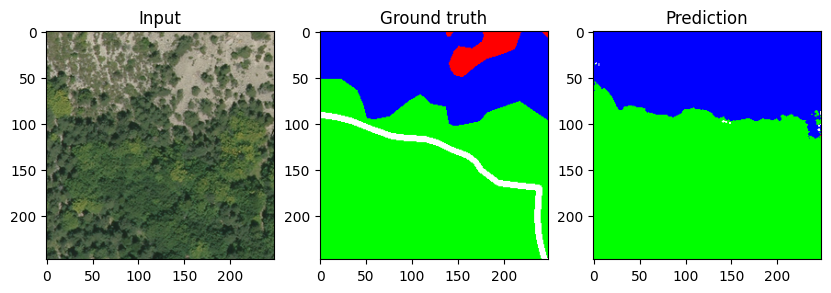

Dice coefficient multilabel of prediction: 0.26140618324279785
1/1 [==============================] - 0s 23ms/step


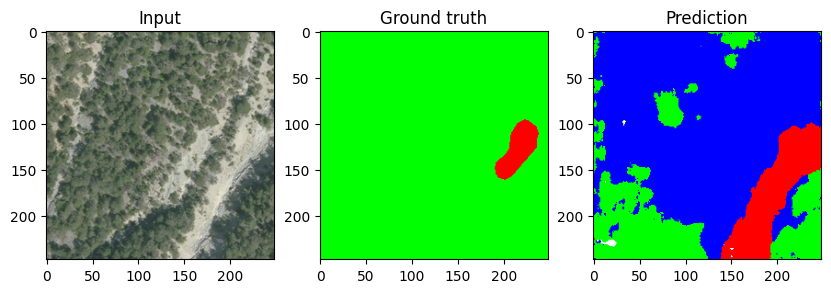

Dice coefficient multilabel of prediction: 0.10234750062227249
1/1 [==============================] - 0s 23ms/step


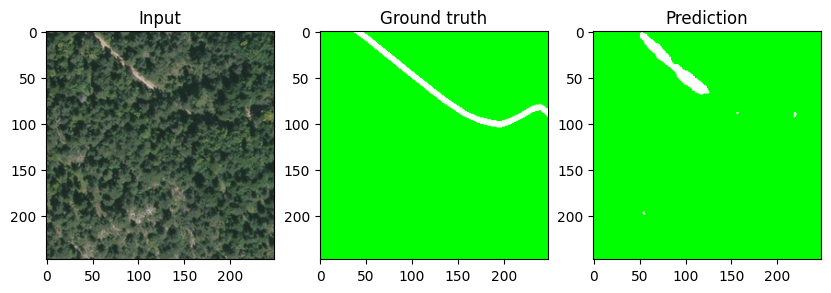

Dice coefficient multilabel of prediction: 0.20802558958530426
1/1 [==============================] - 0s 23ms/step


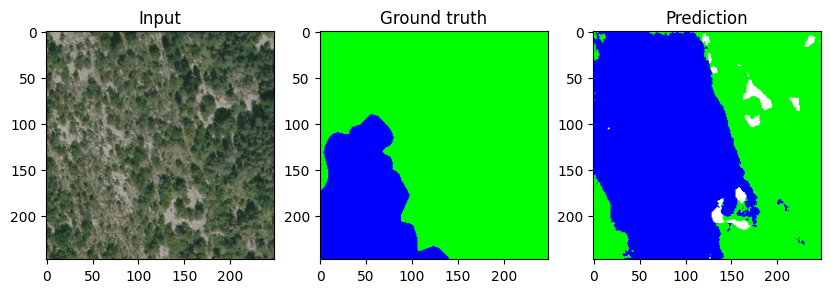

Dice coefficient multilabel of prediction: 0.16242250800132751
1/1 [==============================] - 0s 22ms/step


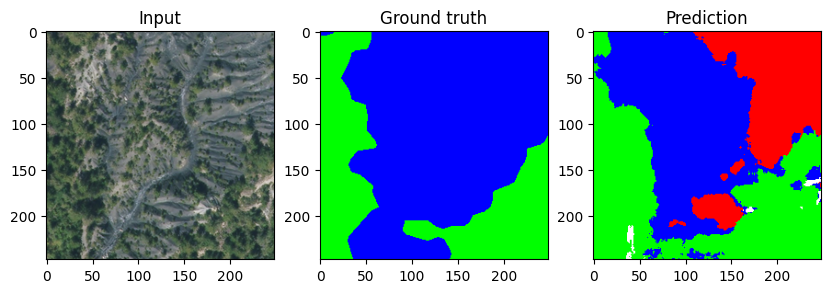

Dice coefficient multilabel of prediction: 0.2064560204744339
1/1 [==============================] - 0s 22ms/step


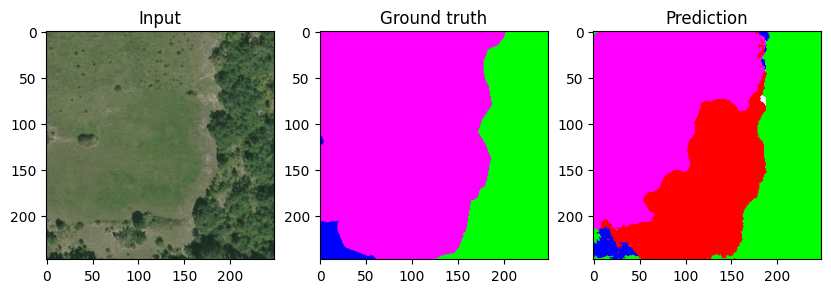

Dice coefficient multilabel of prediction: 0.34196797013282776
1/1 [==============================] - 0s 23ms/step


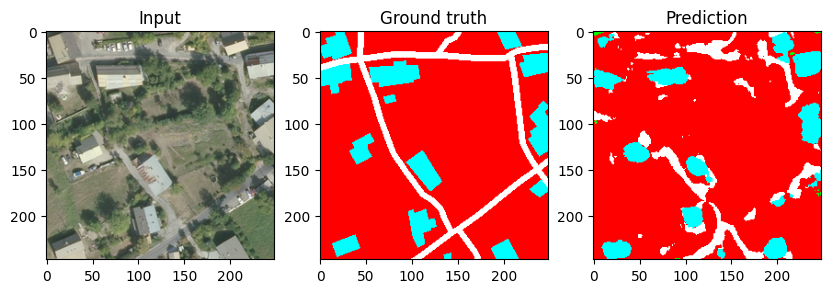

Dice coefficient multilabel of prediction: 0.28289008140563965

Epoch 10: val_dice_coef_multilabel did not improve from 0.52557
300/300 [==============================] - 122s 406ms/step - loss: 0.4465 - dice_coef_multilabel: 0.5535 - val_loss: 0.4815 - val_dice_coef_multilabel: 0.5185 - lr: 0.0010
Epoch 11/100
300/300 [==============================] - ETA: 0s - loss: 0.4437 - dice_coef_multilabel: 0.5563
Epoch 11: val_dice_coef_multilabel did not improve from 0.52557
300/300 [==============================] - 130s 432ms/step - loss: 0.4437 - dice_coef_multilabel: 0.5563 - val_loss: 0.4819 - val_dice_coef_multilabel: 0.5181 - lr: 0.0010
Epoch 12/100
300/300 [==============================] - ETA: 0s - loss: 0.4433 - dice_coef_multilabel: 0.5567
Epoch 12: val_dice_coef_multilabel did not improve from 0.52557
300/300 [==============================] - 114s 380ms/step - loss: 0.4433 - dice_coef_multilabel: 0.5567 - val_loss: 0.5292 - val_dice_coef_multilabel: 0.4708 - lr: 0.0010
Epoch 13

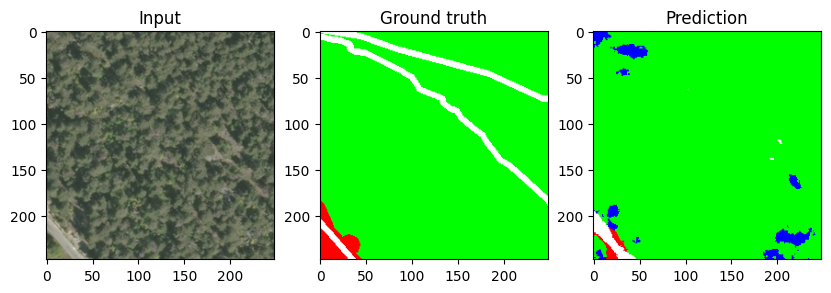

Dice coefficient multilabel of prediction: 0.2136562615633011
1/1 [==============================] - 0s 22ms/step


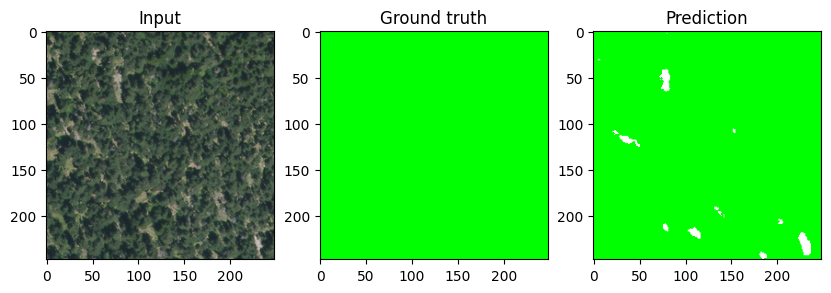

Dice coefficient multilabel of prediction: 0.1435823142528534
1/1 [==============================] - 0s 22ms/step


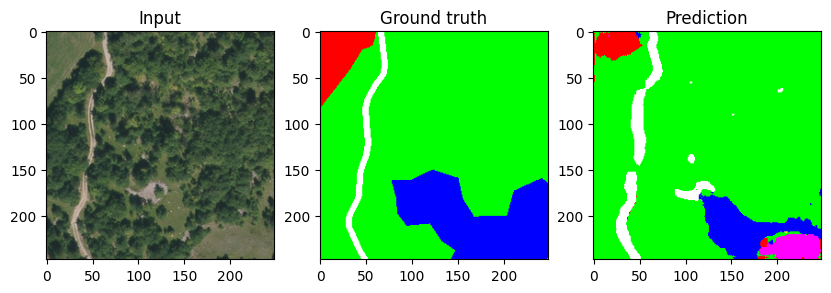

Dice coefficient multilabel of prediction: 0.3900523781776428
1/1 [==============================] - 0s 22ms/step


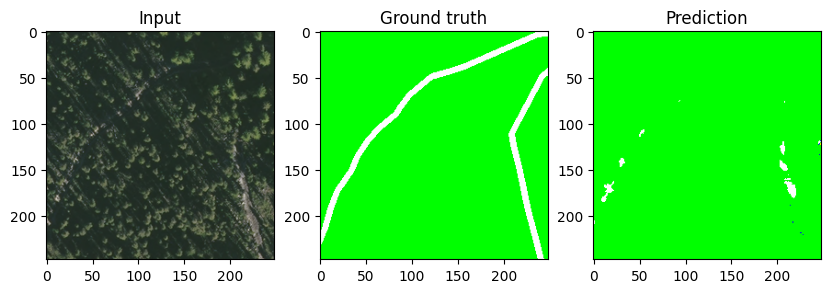

Dice coefficient multilabel of prediction: 0.14757610857486725
1/1 [==============================] - 0s 22ms/step


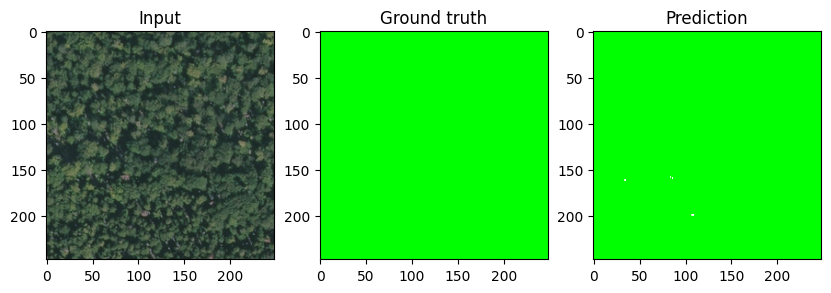

Dice coefficient multilabel of prediction: 0.15451009571552277
1/1 [==============================] - 0s 21ms/step


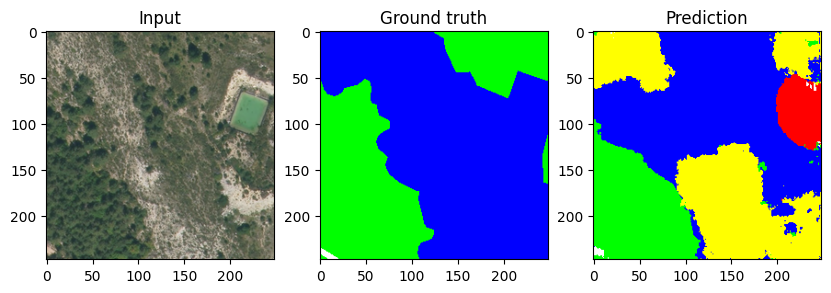

Dice coefficient multilabel of prediction: 0.24516169726848602
1/1 [==============================] - 0s 23ms/step


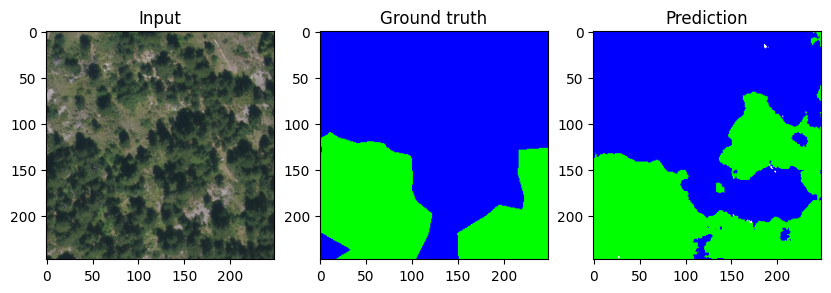

Dice coefficient multilabel of prediction: 0.23182280361652374
1/1 [==============================] - 0s 22ms/step


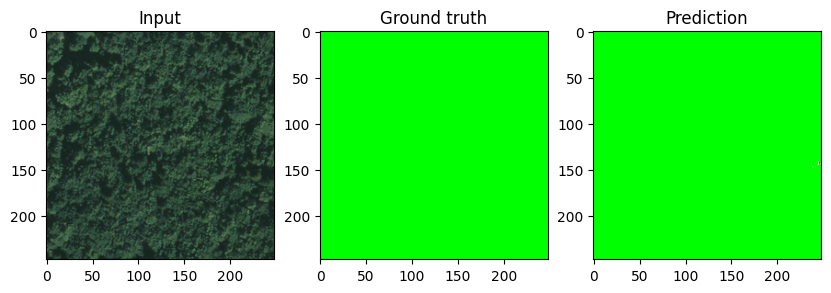

Dice coefficient multilabel of prediction: 0.1560700386762619
1/1 [==============================] - 0s 25ms/step


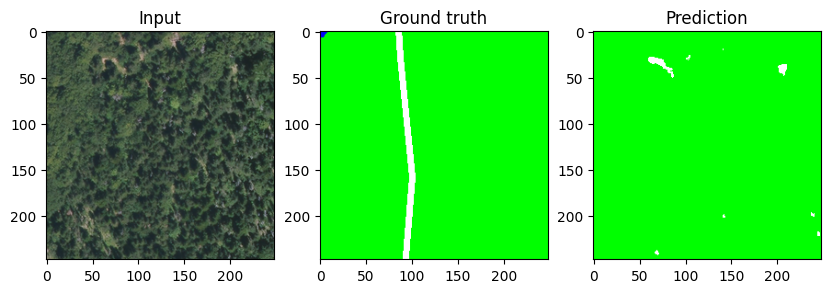

Dice coefficient multilabel of prediction: 0.14910687506198883
1/1 [==============================] - 0s 26ms/step


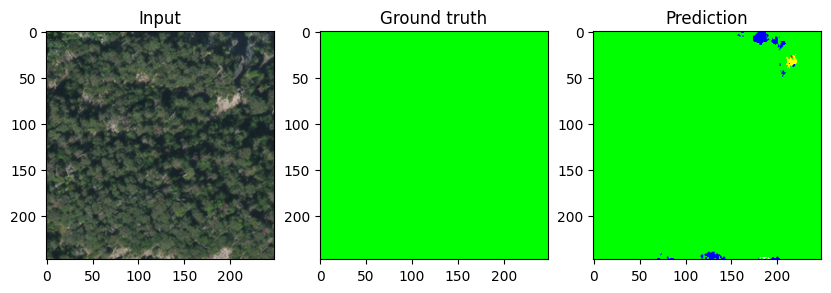

Dice coefficient multilabel of prediction: 0.15134692192077637

Epoch 20: val_dice_coef_multilabel did not improve from 0.56100
300/300 [==============================] - 123s 409ms/step - loss: 0.4233 - dice_coef_multilabel: 0.5767 - val_loss: 0.4701 - val_dice_coef_multilabel: 0.5299 - lr: 0.0010
Epoch 21/100
300/300 [==============================] - ETA: 0s - loss: 0.4147 - dice_coef_multilabel: 0.5853
Epoch 21: val_dice_coef_multilabel did not improve from 0.56100
300/300 [==============================] - 115s 382ms/step - loss: 0.4147 - dice_coef_multilabel: 0.5853 - val_loss: 0.5345 - val_dice_coef_multilabel: 0.4655 - lr: 0.0010
Epoch 22/100
300/300 [==============================] - ETA: 0s - loss: 0.4126 - dice_coef_multilabel: 0.5874
Epoch 22: val_dice_coef_multilabel did not improve from 0.56100
300/300 [==============================] - 114s 378ms/step - loss: 0.4126 - dice_coef_multilabel: 0.5874 - val_loss: 0.5451 - val_dice_coef_multilabel: 0.4549 - lr: 0.0010
Epoch 23

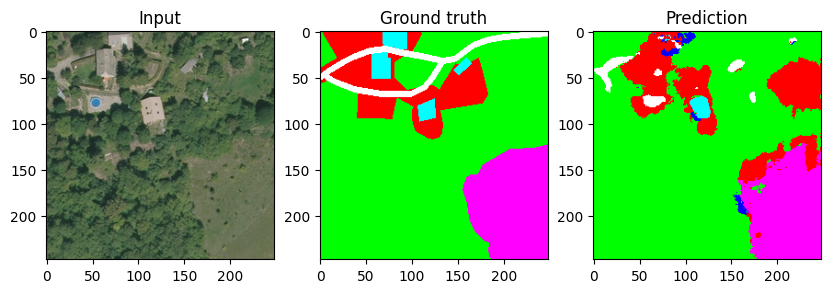

Dice coefficient multilabel of prediction: 0.3651735782623291
1/1 [==============================] - 0s 23ms/step


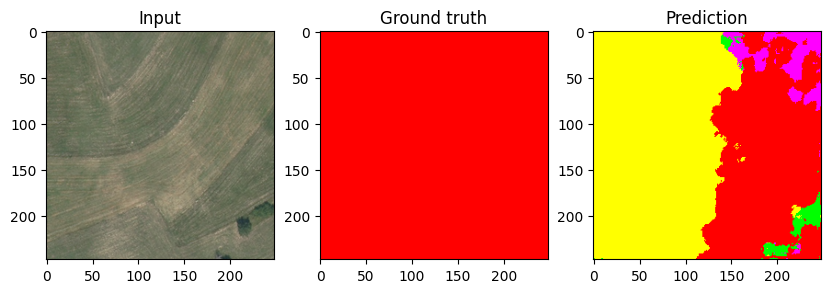

Dice coefficient multilabel of prediction: 0.07832079380750656
1/1 [==============================] - 0s 22ms/step


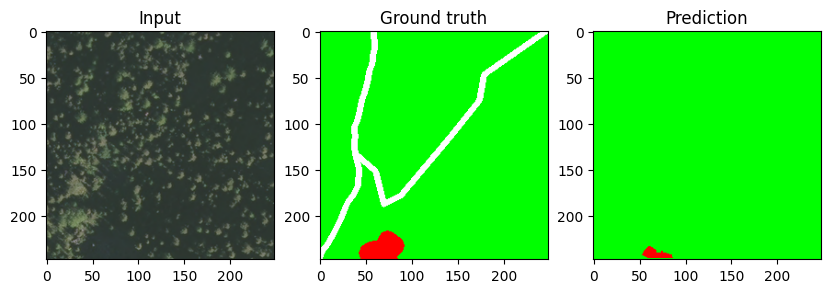

Dice coefficient multilabel of prediction: 0.1992863416671753
1/1 [==============================] - 0s 21ms/step


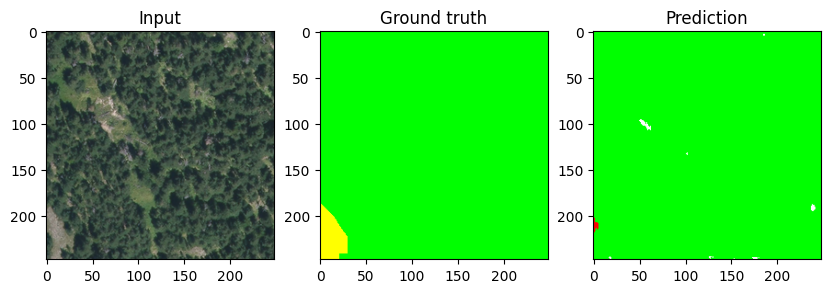

Dice coefficient multilabel of prediction: 0.14338257908821106
1/1 [==============================] - 0s 22ms/step


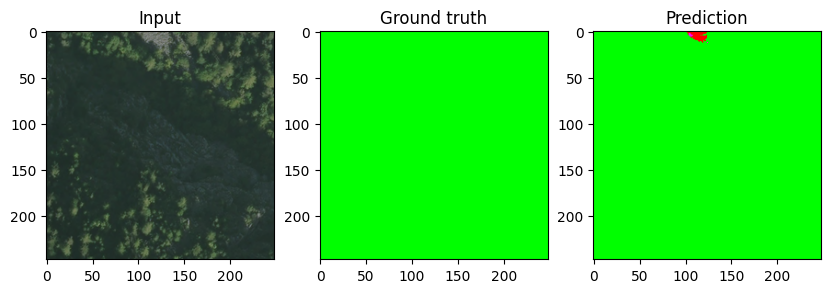

Dice coefficient multilabel of prediction: 0.14527305960655212
1/1 [==============================] - 0s 21ms/step


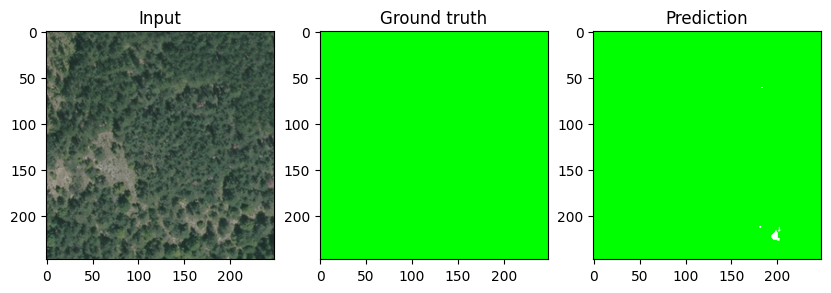

Dice coefficient multilabel of prediction: 0.15207728743553162
1/1 [==============================] - 0s 21ms/step


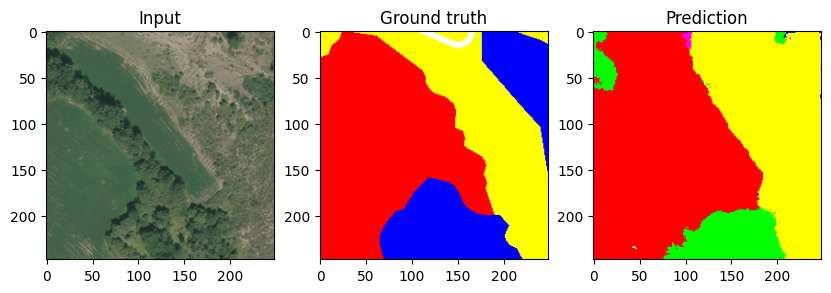

Dice coefficient multilabel of prediction: 0.24619938433170319
1/1 [==============================] - 0s 22ms/step


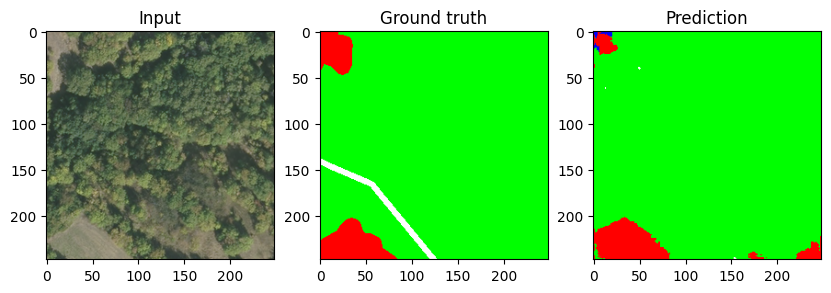

Dice coefficient multilabel of prediction: 0.2462340146303177
1/1 [==============================] - 0s 22ms/step


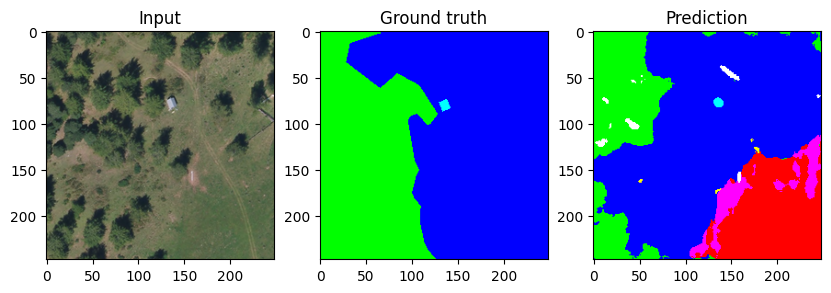

Dice coefficient multilabel of prediction: 0.26089876890182495
1/1 [==============================] - 0s 21ms/step


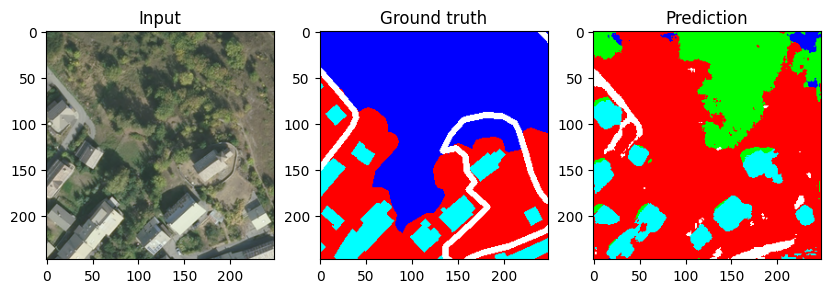

Dice coefficient multilabel of prediction: 0.2520732283592224

Epoch 30: val_dice_coef_multilabel did not improve from 0.59087
300/300 [==============================] - 119s 398ms/step - loss: 0.3955 - dice_coef_multilabel: 0.6045 - val_loss: 0.4207 - val_dice_coef_multilabel: 0.5793 - lr: 1.0000e-04
Epoch 31/100
300/300 [==============================] - ETA: 0s - loss: 0.3917 - dice_coef_multilabel: 0.6083
Epoch 31: val_dice_coef_multilabel did not improve from 0.59087
300/300 [==============================] - 113s 377ms/step - loss: 0.3917 - dice_coef_multilabel: 0.6083 - val_loss: 0.4181 - val_dice_coef_multilabel: 0.5819 - lr: 1.0000e-04
Epoch 32/100
300/300 [==============================] - ETA: 0s - loss: 0.3881 - dice_coef_multilabel: 0.6119
Epoch 32: val_dice_coef_multilabel did not improve from 0.59087
300/300 [==============================] - 115s 383ms/step - loss: 0.3881 - dice_coef_multilabel: 0.6119 - val_loss: 0.4139 - val_dice_coef_multilabel: 0.5861 - lr: 1.0000e-

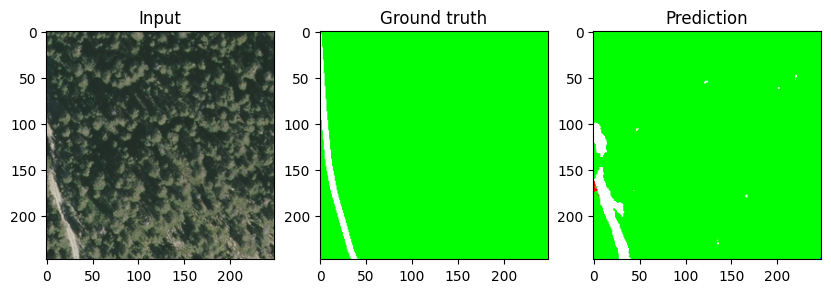

Dice coefficient multilabel of prediction: 0.21794669330120087
1/1 [==============================] - 0s 22ms/step


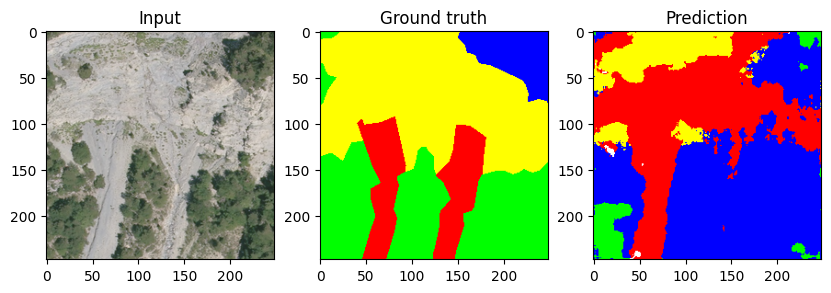

Dice coefficient multilabel of prediction: 0.15097077190876007
1/1 [==============================] - 0s 22ms/step


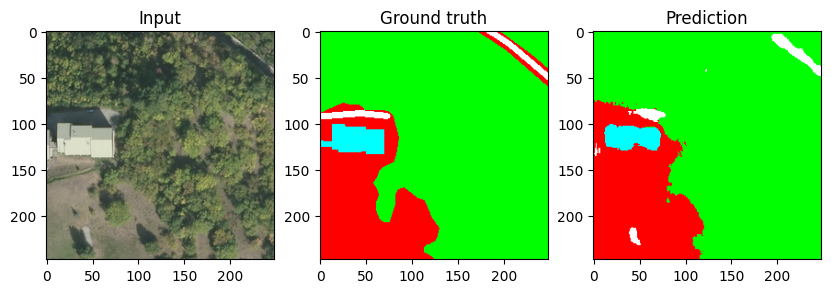

Dice coefficient multilabel of prediction: 0.4475380480289459
1/1 [==============================] - 0s 22ms/step


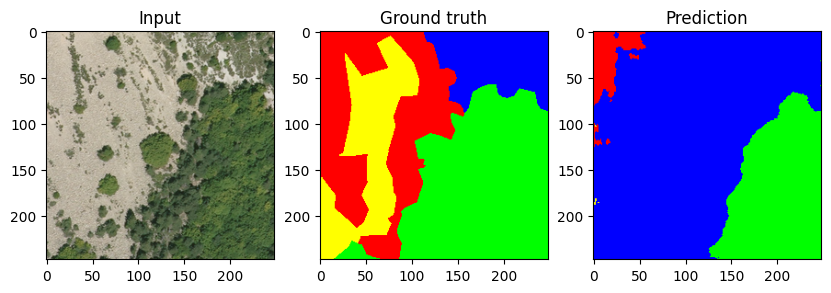

Dice coefficient multilabel of prediction: 0.19145427644252777
1/1 [==============================] - 0s 21ms/step


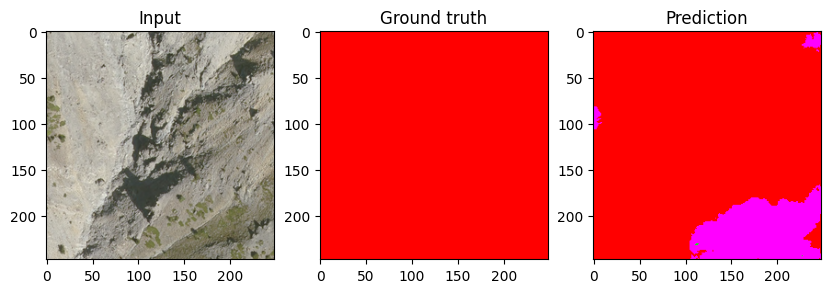

Dice coefficient multilabel of prediction: 0.13335369527339935
1/1 [==============================] - 0s 22ms/step


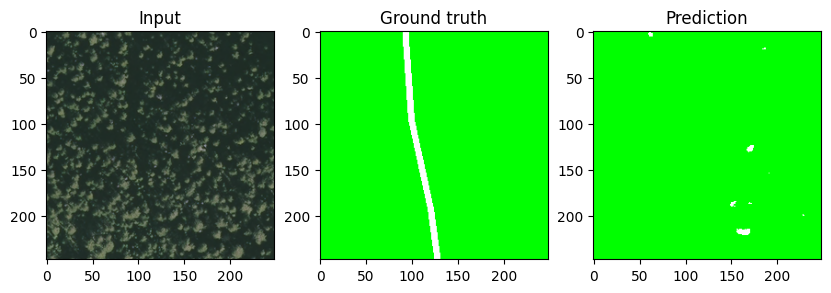

Dice coefficient multilabel of prediction: 0.1530197560787201
1/1 [==============================] - 0s 22ms/step


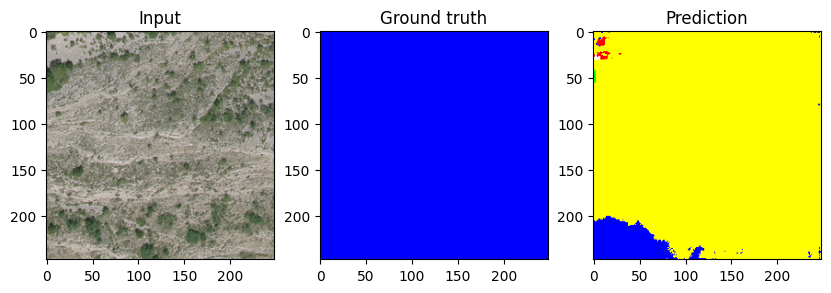

Dice coefficient multilabel of prediction: 0.021949445828795433
1/1 [==============================] - 0s 34ms/step


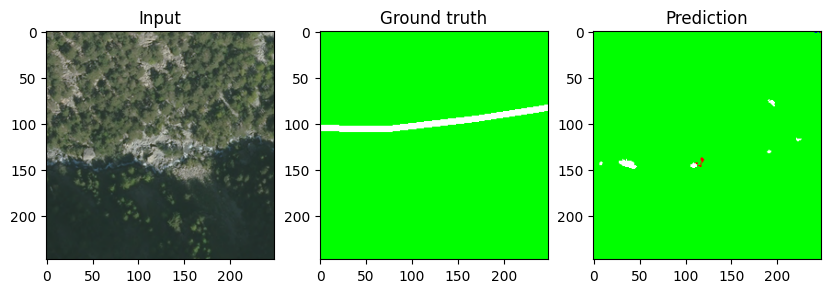

Dice coefficient multilabel of prediction: 0.14616189897060394
1/1 [==============================] - 0s 33ms/step


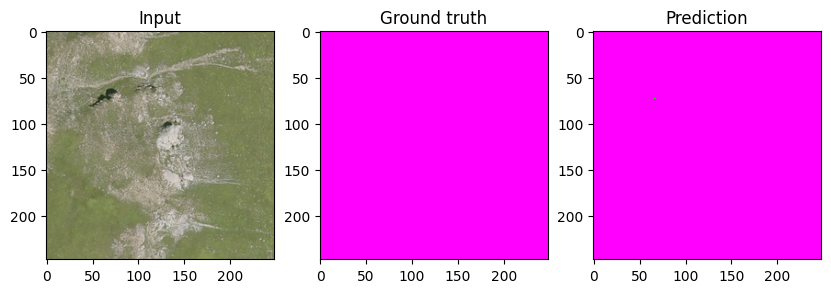

Dice coefficient multilabel of prediction: 0.14523331820964813
1/1 [==============================] - 0s 26ms/step


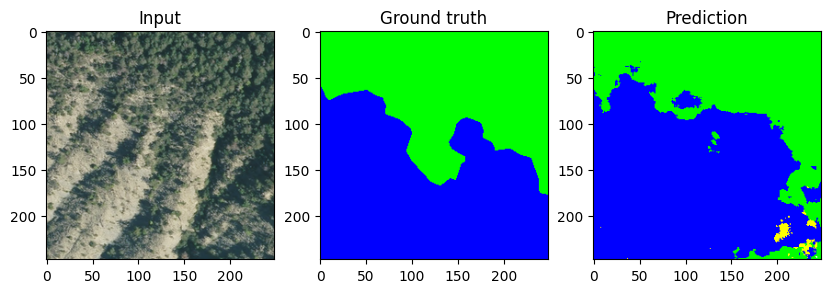

Dice coefficient multilabel of prediction: 0.2537294924259186

Epoch 40: val_dice_coef_multilabel did not improve from 0.59847
300/300 [==============================] - 122s 408ms/step - loss: 0.3870 - dice_coef_multilabel: 0.6130 - val_loss: 0.4141 - val_dice_coef_multilabel: 0.5859 - lr: 1.0000e-04
Epoch 41/100
300/300 [==============================] - ETA: 0s - loss: 0.3882 - dice_coef_multilabel: 0.6118
Epoch 41: val_dice_coef_multilabel did not improve from 0.59847
300/300 [==============================] - 114s 381ms/step - loss: 0.3882 - dice_coef_multilabel: 0.6118 - val_loss: 0.4084 - val_dice_coef_multilabel: 0.5916 - lr: 1.0000e-04
Epoch 42/100
300/300 [==============================] - ETA: 0s - loss: 0.3879 - dice_coef_multilabel: 0.6121
Epoch 42: val_dice_coef_multilabel did not improve from 0.59847
300/300 [==============================] - 111s 371ms/step - loss: 0.3879 - dice_coef_multilabel: 0.6121 - val_loss: 0.4094 - val_dice_coef_multilabel: 0.5906 - lr: 1.0000e-

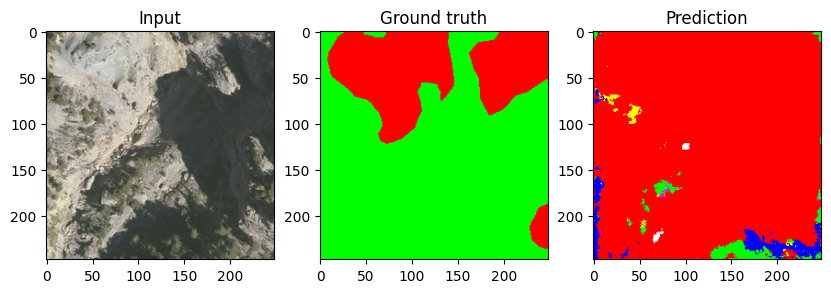

Dice coefficient multilabel of prediction: 0.0746576339006424
1/1 [==============================] - 0s 23ms/step


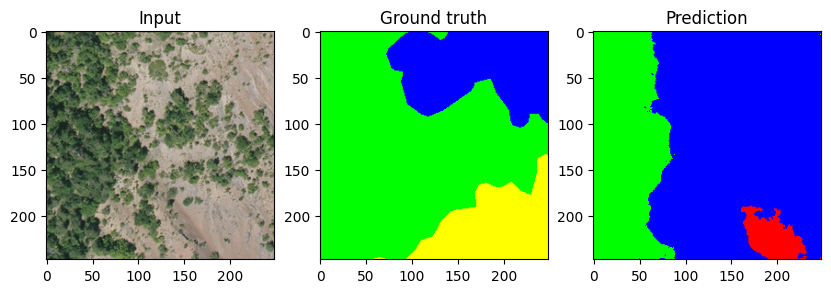

Dice coefficient multilabel of prediction: 0.163421630859375
1/1 [==============================] - 0s 23ms/step


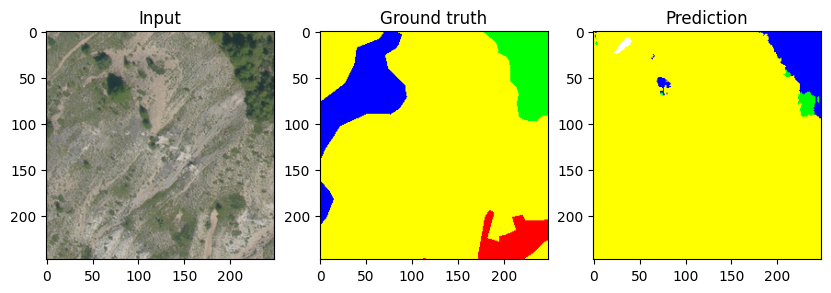

Dice coefficient multilabel of prediction: 0.1721724420785904
1/1 [==============================] - 0s 23ms/step


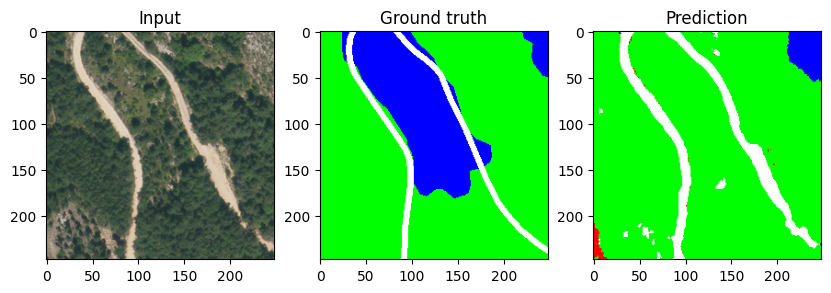

Dice coefficient multilabel of prediction: 0.22061511874198914
1/1 [==============================] - 0s 23ms/step


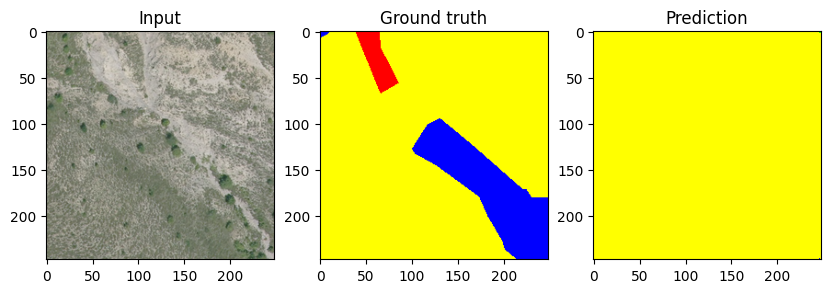

Dice coefficient multilabel of prediction: 0.13267259299755096
1/1 [==============================] - 0s 22ms/step


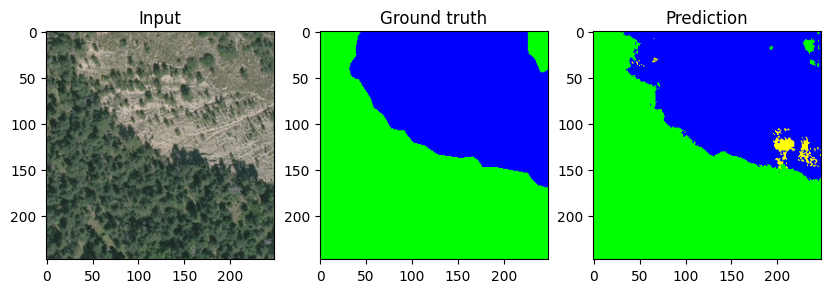

Dice coefficient multilabel of prediction: 0.3038565516471863
1/1 [==============================] - 0s 22ms/step


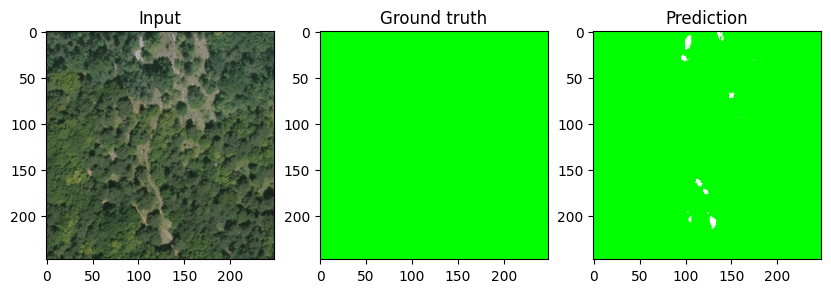

Dice coefficient multilabel of prediction: 0.15407250821590424
1/1 [==============================] - 0s 23ms/step


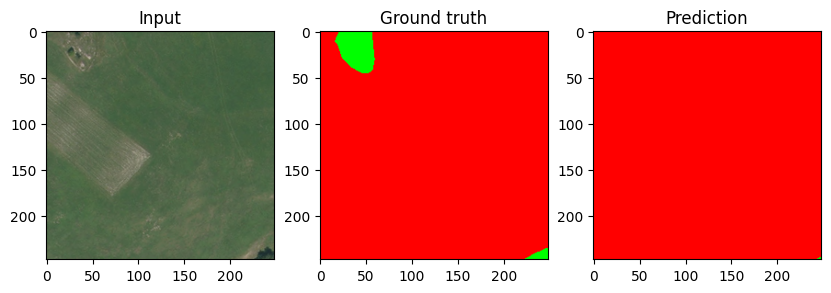

Dice coefficient multilabel of prediction: 0.19903993606567383
1/1 [==============================] - 0s 22ms/step


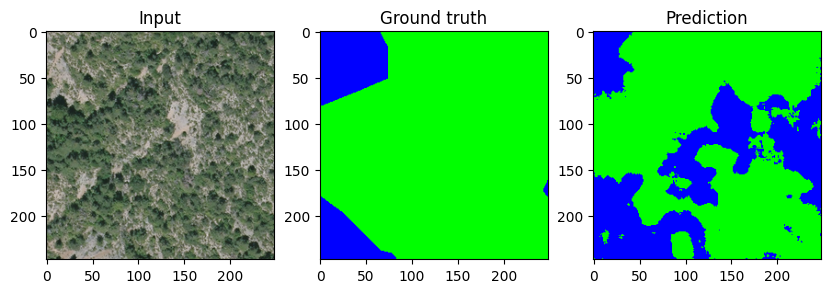

Dice coefficient multilabel of prediction: 0.1948213428258896
1/1 [==============================] - 0s 22ms/step


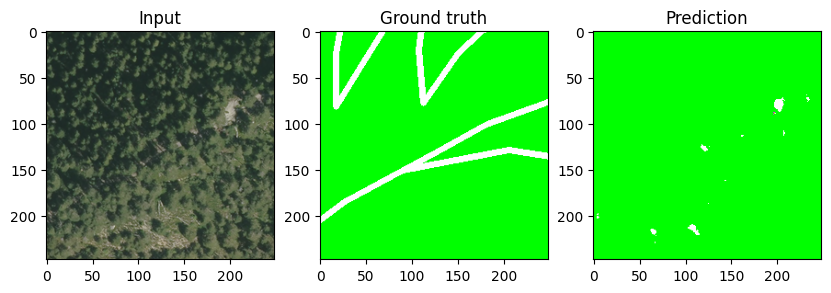

Dice coefficient multilabel of prediction: 0.14527085423469543

Epoch 50: val_dice_coef_multilabel did not improve from 0.59927
300/300 [==============================] - 118s 393ms/step - loss: 0.3848 - dice_coef_multilabel: 0.6152 - val_loss: 0.4159 - val_dice_coef_multilabel: 0.5841 - lr: 1.0000e-04
Epoch 51/100
300/300 [==============================] - ETA: 0s - loss: 0.3791 - dice_coef_multilabel: 0.6209
Epoch 51: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 51: val_dice_coef_multilabel did not improve from 0.59927
300/300 [==============================] - 113s 377ms/step - loss: 0.3791 - dice_coef_multilabel: 0.6209 - val_loss: 0.4075 - val_dice_coef_multilabel: 0.5925 - lr: 1.0000e-04
Epoch 52/100
300/300 [==============================] - ETA: 0s - loss: 0.3871 - dice_coef_multilabel: 0.6129
Epoch 52: val_dice_coef_multilabel did not improve from 0.59927
300/300 [==============================] - 115s 385ms/step - loss: 0.3871 - dice_coef_multila

In [109]:
history = model.fit(traingen,
            steps_per_epoch = np.ceil(float(len(train_names)) / float(BATCH_SIZE)),
            epochs=100,
            validation_data = valgen,
            validation_steps = np.ceil(float(len(test_names)) / float(BATCH_SIZE)),
            callbacks=callbacks
            )

Training stopped at epoch 58 by using early stopping.

We reach a good validation dice coefficient at just below 0.6, and the predicted images give pretty good results qualitatively speaking.

## Final results: plots and evaluation

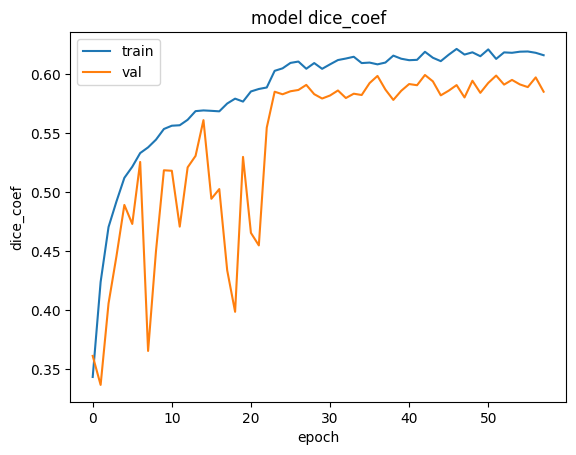

In [113]:
plt.plot(history.history['dice_coef_multilabel'])
plt.plot(history.history['val_dice_coef_multilabel'])
plt.title('model dice_coef')
plt.ylabel('dice_coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

The loss plot is simply the dice coefficient plot inverted, but I'll show it anyway for completeness

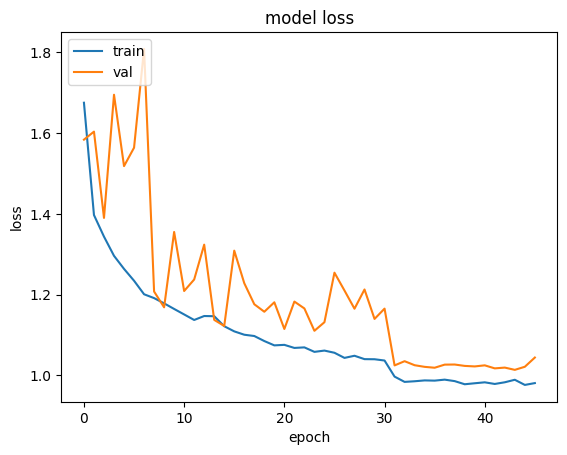

In [114]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

The training curve is pretty smooth, and while the validation curve is not as smooth, it follows pretty consistently, before eventually smoothing out in the last part of the training, when the ReduceLROnPlateau callback reduces the learning rate

In [2]:
model.load_weights(CHECKPOINT_PATH)
model.evaluate(valgen, verbose=1);

100/100 [==============================] - 26s 258ms/step - loss: 0.4013 - dice_coef_multilabel: 0.5987
